In [1]:
import numpy
import pandas
import geopandas
import pysal
import seaborn
import contextily
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from shapely.geometry import Point


import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.patches import Polygon, Circle, Rectangle, Patch
from matplotlib.lines import Line2D

# Data preparation and Processing
Download the crime data in 2024 from https://data.lacity.org/Public-Safety/Crime-Data-from-2020-to-Present/2nrs-mtv8/data_preview
Saved as .csv file (Crime_Data_LA_2024.csv)

In [2]:
# read the .csv file.
df_crime_la = pandas.read_csv("./Crime_Data_LA_2024.csv")

In [3]:
# convert the data frame to a geodataframe, specifying the coordinate reference system

pts = df_crime_la.apply(lambda r: Point(r.LON, r.LAT), axis=1)
gdb = geopandas.GeoDataFrame(
    df_crime_la.assign(geometry=pts),
    crs="EPSG:4326"  # Correct syntax
)
gdb = gdb.to_crs(epsg=3857)

xys = gdb['geometry'].apply(lambda pt: pandas.Series({'x': pt.x, 'y': pt.y}))
gdb['x'] = xys['x']
gdb['y'] = xys['y']

# Data Visualization
Seaborn is a Python data visualization library built on top of Matplotlib and closely integrated with Pandas. It provides high-level functions to create aesthetically pleasing and informative statistical graphics.

Website: https://seaborn.pydata.org/

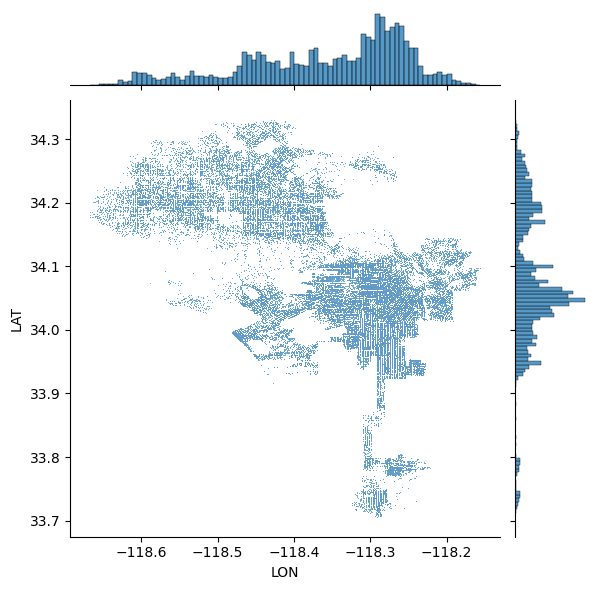

In [4]:
# use Seaborn package to Generate scatter plot
seaborn.jointplot(x="LON", y="LAT", data=gdb, s=0.5);

contextily is a Python package used to add basemaps (background maps) to geospatial data visualizations in Matplotlib and Geopandas plots. It works by fetching web tiles from online map providers (e.g., OpenStreetMap, Stamen, Carto) and overlaying them onto geospatial plots.

Official Documentation: https://contextily.readthedocs.io/

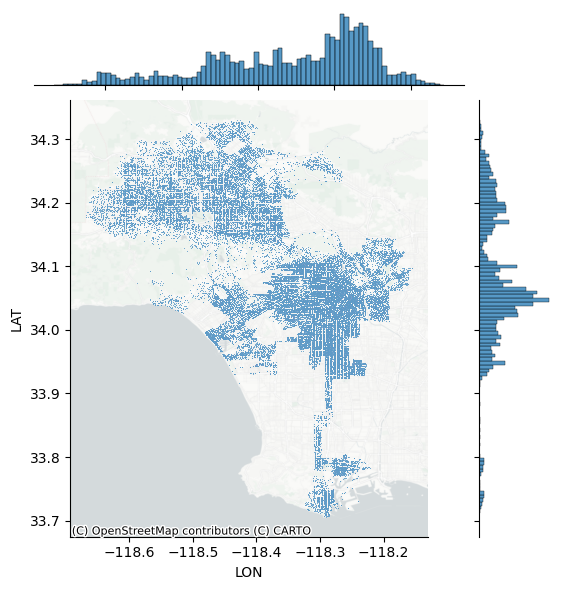

In [5]:
# Use the contextlity to add basemaps
joint_axes = seaborn.jointplot(
    x="LON", y="LAT", data=gdb, s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels,
);

To reduce clutter, we can turn point data into a spatial histogram by dividing the area into a regular grid (squares or hexagons) and counting how many points fall into each cell. This works like a choropleth map, making patterns easier to see.
Hexagonal binning (hexbin) is often better than square grids because it reduces shape distortion and creates a more uniform connection between cells. This method provides a clear and intuitive way to visualize dense point data.

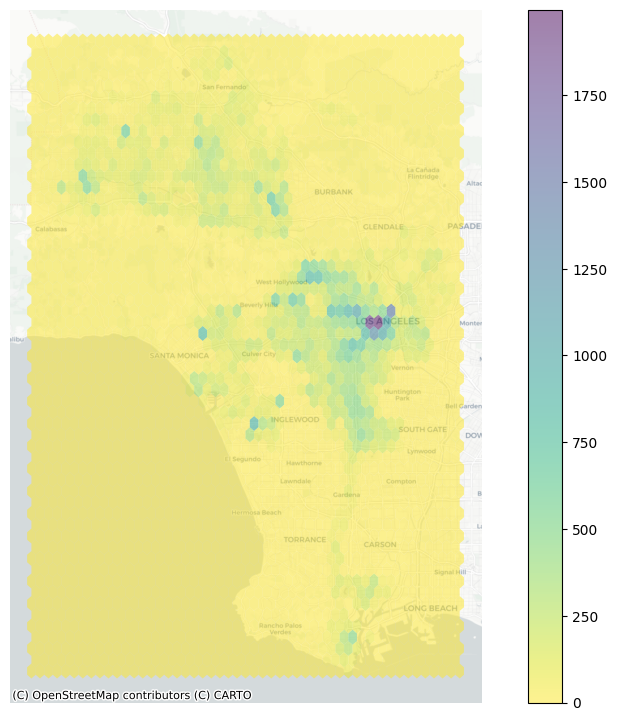

In [6]:
## Showing density with hexbinning
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 9))
# Generate and add hexbin with 50 hexagons in each
# dimension, no borderlines, half transparency,
# and the reverse viridis colormap
hb = ax.hexbin(
    gdb["x"],
    gdb["y"],
    gridsize=50,
    linewidths=0,
    alpha=0.5,
    cmap="viridis_r",
)
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

An alternative is kernel density estimation (KDE), which creates a smooth surface instead of rigid bins. Instead of just counting points in squares, KDE places "kernels" (small weighting functions) over a grid and gives nearby points different weights based on distance. The most common kernel uses a normal distribution, creating a continuous heatmap of probability across the area.

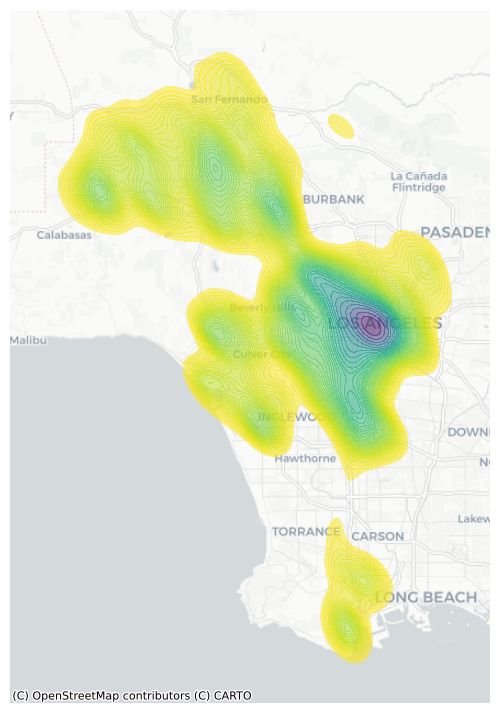

In [7]:
# kernel density estimation
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    x="x",
    y="y",
    data=gdb,
    n_levels=50,
    fill=True,
    alpha=0.55,
    cmap="viridis_r",
)
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()

# Point Pattern Analysis
## Tendency
A common way to measure the center of a point pattern is by finding its center of mass. For marked point patterns, this center is closer to points with higher values. For unmarked point patterns, it’s the average of all the coordinates (mean center). The median center is like the median in other data, where half of the points are on one side and half are on the other. We can analyze the mean center of our Flickr point pattern using the pointpats package in Python.

In [8]:
from pointpats import centrography

In [9]:
mean_center = centrography.mean_center(gdb[["x", "y"]])
med_center = centrography.euclidean_median(gdb[["x", "y"]])

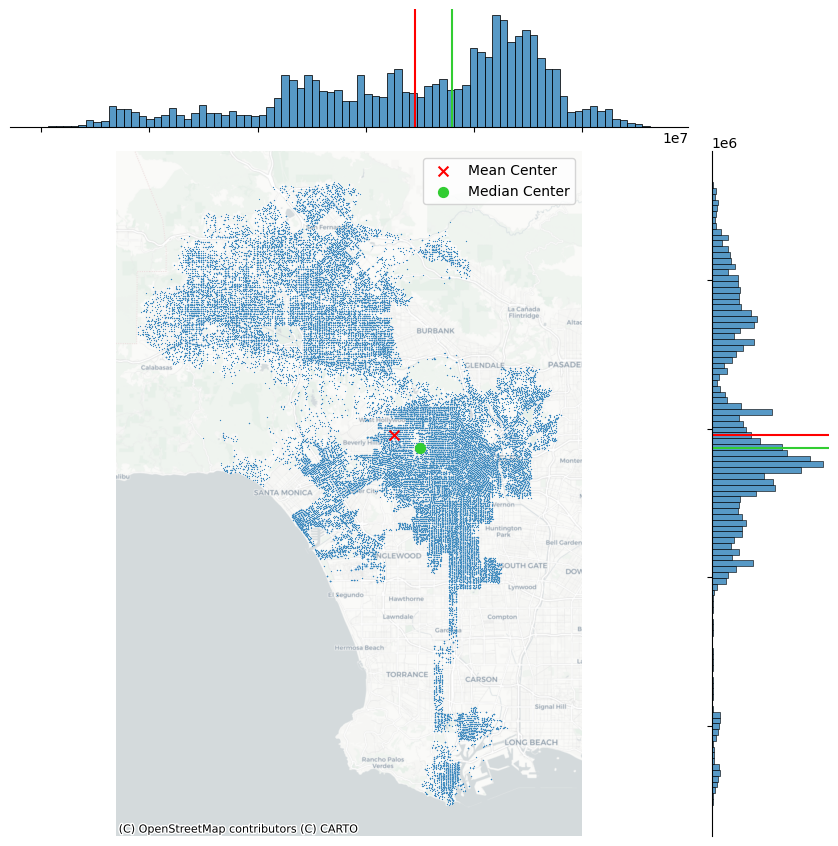

In [10]:
# Generate scatterplot
joint_axes = seaborn.jointplot(
    x="x", y="y", data=gdb, s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color="red", marker="x", s=50, label="Mean Center"
)
joint_axes.ax_marg_x.axvline(mean_center[0], color="red")
joint_axes.ax_marg_y.axhline(mean_center[1], color="red")
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center,
    color="limegreen",
    marker="o",
    s=50,
    label="Median Center"
)
joint_axes.ax_marg_x.axvline(med_center[0], color="limegreen")
joint_axes.ax_marg_y.axhline(med_center[1], color="limegreen")
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

## Dispersion
Dispersion describes how spread out points are around the center. A common measure is standard distance, which calculates the average distance of points from the center (like the center of mass). This helps show how tightly or loosely points are clustered. You can easily compute this using the std_distance function in pointpats

In [11]:
centrography.std_distance(gdb[["x", "y"]])

19026.90572219582

Another useful way to visualize dispersion is the standard deviational ellipse (or standard ellipse). This ellipse shows the center, spread, and direction of the point pattern. You can create it using the ellipse function in pointpats

In [12]:
major, minor, rotation = centrography.ellipse(gdb[["x", "y"]])

In [13]:
major

11773.983260314046

In [14]:
minor

14521.04858577387

In [15]:
rotation

-0.5785043360749267

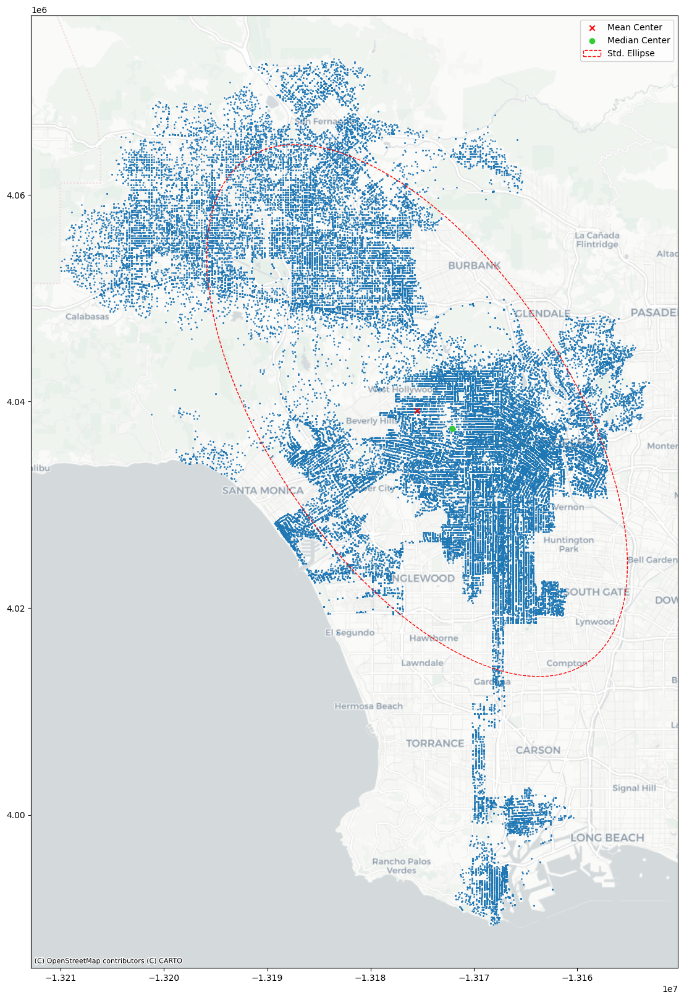

In [16]:
# Construct the standard ellipse using matplotlib
from matplotlib.patches import Ellipse

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(20, 20))
# Plot photograph points
ax.scatter(gdb["x"], gdb["y"], s=0.75)
ax.scatter(*mean_center, color="red", marker="x", label="Mean Center")
ax.scatter(
    *med_center, color="limegreen", marker="o", label="Median Center"
)

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(
    xy=mean_center,  # center the ellipse on our mean center
    width=major * 5,  # centrography.ellipse only gives half the axis
    height=minor * 2,
    angle=numpy.rad2deg(
        rotation-0.4
    ),  # Angles for this are in degrees, not radians
    facecolor="none",
    edgecolor="red",
    linestyle="--",
    label="Std. Ellipse",
)
ax.add_patch(ellipse)

ax.legend()
# Display
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
plt.show()

## Extent
There are five shapes to evaluate the extent of a point of cloud: 
1. Alpha Shape
2. Minimum Rotated Rectangle
3. Convex Hull
4. Min Bounding Rectangle
5. Min Bounding Circle
Each shape captures a different level of tightness around the points to measure how spread out a point cloud is.

next, We'll show how to create each shape and compare them using a sub dataset(robbery) of the crime points.

In [17]:
# Rename the column
gdb = gdb.rename(columns={"Crm Cd": "Crm_Cd"})  


In [18]:
# query for robbery
robbery = gdb.query("Crm_Cd == 210") 

coordinates = robbery[["x", "y"]].values

The convex hull is the smallest shape that fully encloses the locations of the robbery. A convex shape has no inward curves or gaps, and all of its interior angles are less than 180 degrees. This is calculated using the centrography.hull method.

In [19]:
convex_hull_vertices = centrography.hull(coordinates)

An alpha shape is a "tighter" version of the convex hull. Imagine a convex hull as the space left by rolling a huge ball around the shape. The ball is so big that it doesn't fit into the gaps and just creates straight lines. An alpha shape, on the other hand, is like rolling a smaller ball around the shape. This smaller ball fits into the dips and valleys between points, making the shape tighter. As the ball gets bigger, the alpha shape turns into the convex hull. If the ball gets too small, the shape can break into multiple parts. To avoid this, the libpysal package has an alpha_shape_auto function that finds the best size for the ball automatically.

In [20]:
import libpysal

alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(
    coordinates, return_circles=True
)

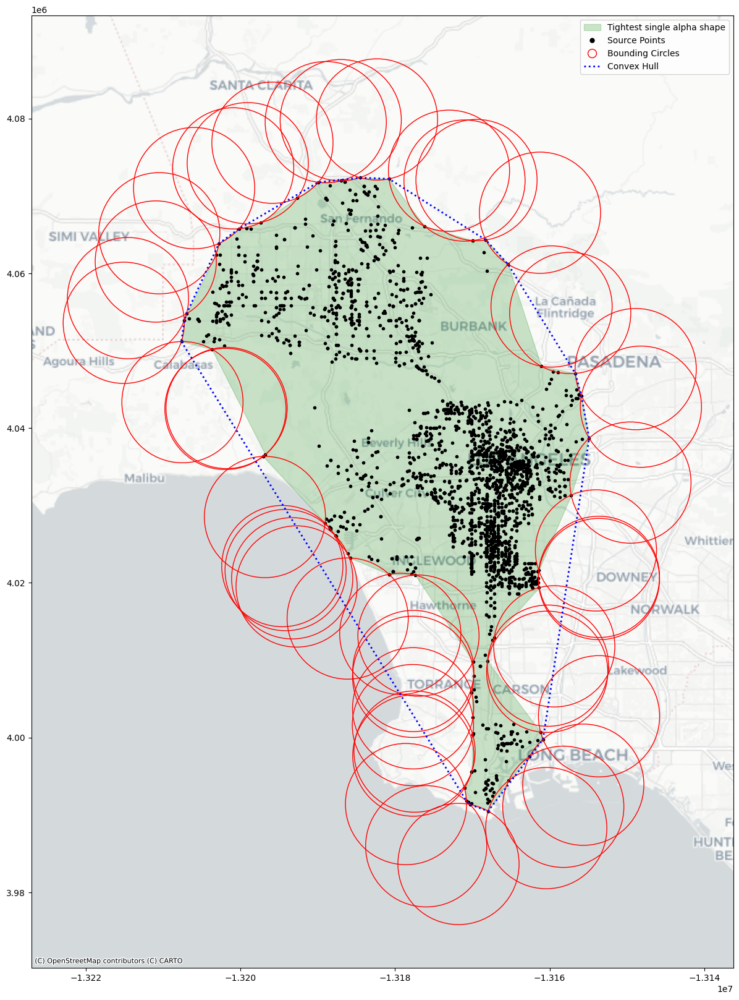

In [21]:


f, ax = plt.subplots(1, 1, figsize=(20, 20))

# Plot a green alpha shape
alpha_plot = geopandas.GeoSeries([alpha_shape]).plot(
    ax=ax, edgecolor="green", facecolor="green", alpha=0.2, label="_nolabel_"
)

# Include the points for our prolific user in black
points_plot = ax.scatter(*coordinates.T, color="k", marker=".", label="Source Points")

# Plot the circles forming the boundary of the alpha shape
circle_patches = []
for circle in circs:
    circ_patch = Circle(circle, radius=alpha, facecolor="none", edgecolor="r")
    ax.add_patch(circ_patch)
    circle_patches.append(circ_patch)

# Add a blue convex hull
convex_hull_patch = Polygon(
    convex_hull_vertices, closed=True, edgecolor="blue",
    facecolor="none", linestyle=":", linewidth=2
)
ax.add_patch(convex_hull_patch)

# Add basemap
contextily.add_basemap(ax, source=contextily.providers.CartoDB.Positron)

#  **Manually Define Legend Using the Original Symbols**
legend_elements = [
    Patch(facecolor="green", edgecolor="green", alpha=0.2, label="Tightest single alpha shape"),  # Alpha Shape
    Line2D([], [], color="black", marker=".", linestyle="None", markersize=10, label="Source Points"),  # Black Dots
    Line2D([], [], color="red", marker="o", linestyle="None", markersize=10, markerfacecolor="none", label="Bounding Circles"),  # Red Circles
    Line2D([], [], color="blue", linestyle=":", linewidth=2, label="Convex Hull"),  # Blue Convex Hull
]

ax.legend(handles=legend_elements, loc="upper right")

plt.show()


To calculate the minimum rotated rectangle, we’ll use the minimum_rotated_rectangle function from the pygeos module. This function finds the smallest rectangle that can surround our points, even if it's rotated. First, we'll group all the points into a single multi-point object and then calculate the rotated rectangle for that group.

In [22]:
from pygeos import minimum_rotated_rectangle, from_shapely, to_shapely

point_array = geopandas.points_from_xy(x=robbery.x, y=robbery.y)

min_rot_rect = minimum_rotated_rectangle(
    from_shapely(
        point_array.unary_union()
    )
)
min_rot_rect = to_shapely(min_rot_rect)

C:\Users\bsb5pw\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pygeos\io.py:89: UserWarning: The shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the PyGEOS GEOS version (3.10.4-CAPI-1.16.2). Conversions between both will be slow
  warnings.warn(


In [23]:
min_rect_vertices = centrography.minimum_bounding_rectangle(
    coordinates
)

In [24]:
min_rect_vertices 

(-13207634.568556894,
 3990503.707557406,
 -13154891.393819042,
 4072363.7664709683)

In [25]:
(center_x, center_y), radius = centrography.minimum_bounding_circle(
    coordinates
)

In [26]:
from matplotlib.patches import Polygon, Circle, Rectangle

# Make a blue convex hull
convex_hull_patch = Polygon(
    convex_hull_vertices,
    closed=True,
    edgecolor="blue",
    facecolor="none",
    linestyle=":",
    linewidth=2,
    label="Convex Hull",
)

# compute the width and height of the minimum bounding rectangle
min_rect_width = min_rect_vertices[2] - min_rect_vertices[0]
min_rect_height = min_rect_vertices[3] - min_rect_vertices[1]

# Make a goldenrod minimum bounding rectangle
min_rect_patch = Rectangle(
    min_rect_vertices[0:2],
    width=min_rect_width,
    height=min_rect_height,
    edgecolor="goldenrod",
    facecolor="none",
    linestyle="dashed",
    linewidth=2,
    label="Min Bounding Rectangle",
)

# and make a red minimum bounding circle
circ_patch = Circle(
    (center_x, center_y),
    radius=radius,
    edgecolor="red",
    facecolor="none",
    linewidth=2,
    label="Min Bounding Circle",
)

In [27]:
min_rect_width 

52743.17473785207

In [28]:
min_rect_height

81860.05891356245

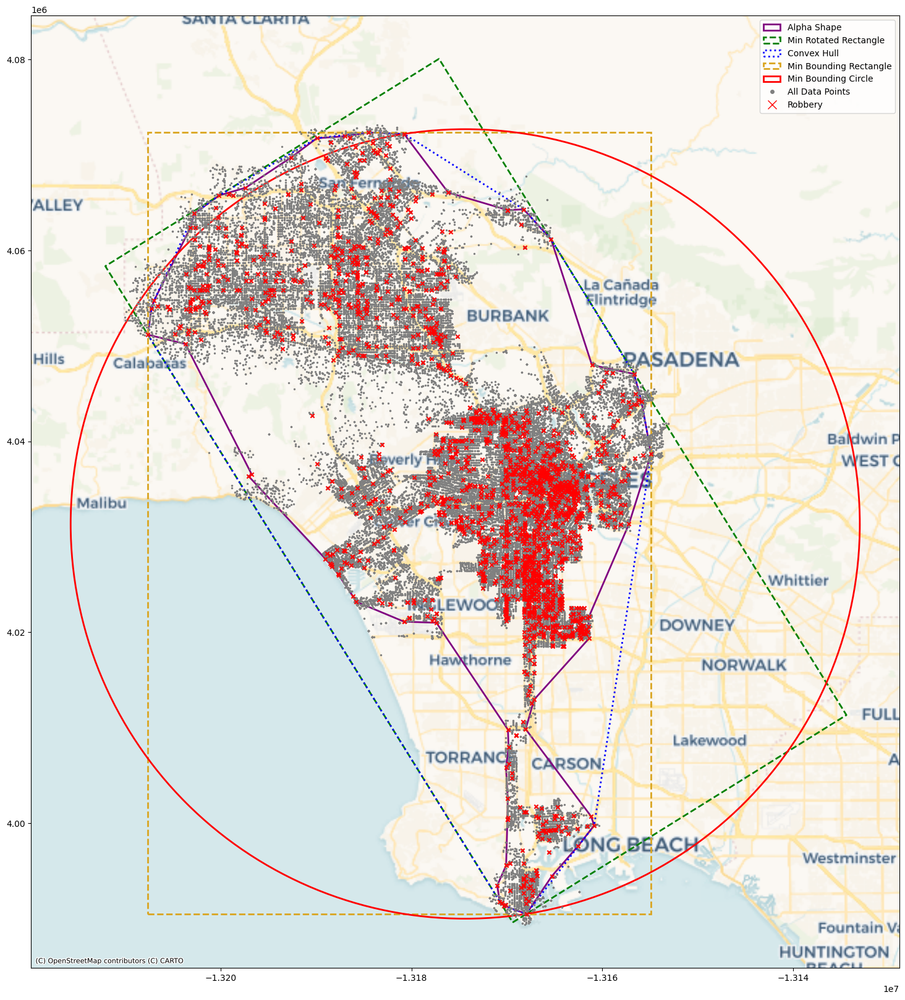

In [29]:


f, ax = plt.subplots(1, figsize=(20, 20))

# Plot Alpha Shape (purple)
geopandas.GeoSeries([alpha_shape]).plot(
    ax=ax, edgecolor="purple", facecolor="none", linewidth=2
)

# Plot Minimum Rotated Rectangle (green)
geopandas.GeoSeries([min_rot_rect]).plot(
    ax=ax, edgecolor="green", facecolor="none", linestyle="--", linewidth=2
)

# Create patch instances
convex_hull_patch_new = Polygon(
    convex_hull_vertices, closed=True, edgecolor="blue", facecolor="none", linestyle=":", linewidth=2
)

min_rect_patch_new = Rectangle(
    min_rect_vertices[0:2], width=min_rect_width, height=min_rect_height,
    edgecolor="goldenrod", facecolor="none", linestyle="dashed", linewidth=2
)

circ_patch_new = Circle(
    (center_x, center_y), radius=radius, edgecolor="red", facecolor="none", linewidth=2
)

# Add patches to plot
ax.add_patch(convex_hull_patch_new)
ax.add_patch(min_rect_patch_new)
ax.add_patch(circ_patch_new)

# Scatter plot
ax.scatter(gdb.x, gdb.y, s=2, color="grey", label="_nolegend_")  # Hide default legend
ax.scatter(robbery.x, robbery.y, s=20, color="r", marker="x", label="_nolegend_")

# Manually create legend handles with original symbols
legend_handles = [
    mpatches.Patch(edgecolor="purple", facecolor="none", linewidth=2, label="Alpha Shape"),
    mpatches.Patch(edgecolor="green", facecolor="none", linestyle="--", linewidth=2, label="Min Rotated Rectangle"),
    mpatches.Patch(edgecolor="blue", facecolor="none", linestyle=":", linewidth=2, label="Convex Hull"),
    mpatches.Patch(edgecolor="goldenrod", facecolor="none", linestyle="dashed", linewidth=2, label="Min Bounding Rectangle"),
    mpatches.Circle((0, 0), radius=5, edgecolor="red", facecolor="none", linewidth=2, label="Min Bounding Circle"),
    mlines.Line2D([], [], color="grey", marker="o", linestyle="None", markersize=4, label="All Data Points"),
    mlines.Line2D([], [], color="red", marker="x", linestyle="None", markersize=10, label="Robbery"),
]

# Add custom legend with original symbols
ax.legend(handles=legend_handles, loc="upper right")

# Add basemap
contextily.add_basemap(ax, source=contextily.providers.CartoDB.Voyager)

plt.show()


Each shape gives a different view of the area around the locations of robbery. The alpha shape is the tightest, while the minimum bounding rectangle and circle are the loosest, covering more area outside the usual photo range. However, the rectangle and circle are the easiest shapes to draw and understand.

# Randomness and Clustering
Spatial statistics often look at how evenly points are spread out. This means checking if the points are clustered together or spread evenly across the area. These methods help measure the overall clustering or dispersion of points. One method, called quadrat statistics, divides the area into smaller sections (quadrants) and checks how evenly points are distributed across them.

In [30]:
from pointpats import (
    distance_statistics,
    QStatistic,
    random,
    PointPattern,
)

A Poisson point process illustrates complete spatial randomness, where points are placed without clustering or dispersion.

In [31]:
random_pattern = random.poisson(coordinates, size=len(coordinates))

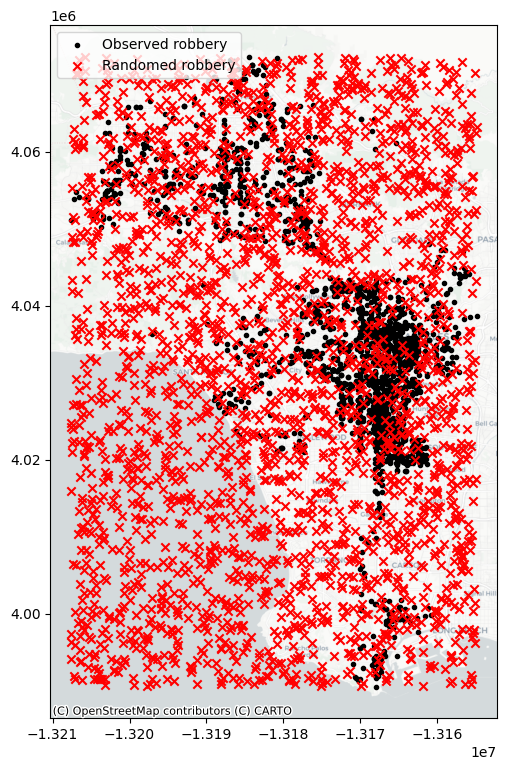

In [32]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(
    *coordinates.T,
    color="k",
    marker=".",
    label="Observed robbery"
)
plt.scatter(*random_pattern.T, color="r", marker="x", label="Randomed robbery")
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="upper left")
plt.show()

To simulate within restricted areas, use the hulls from the point pattern

In [33]:
random_pattern_ashape = random.poisson(
    alpha_shape, size=len(coordinates)
)

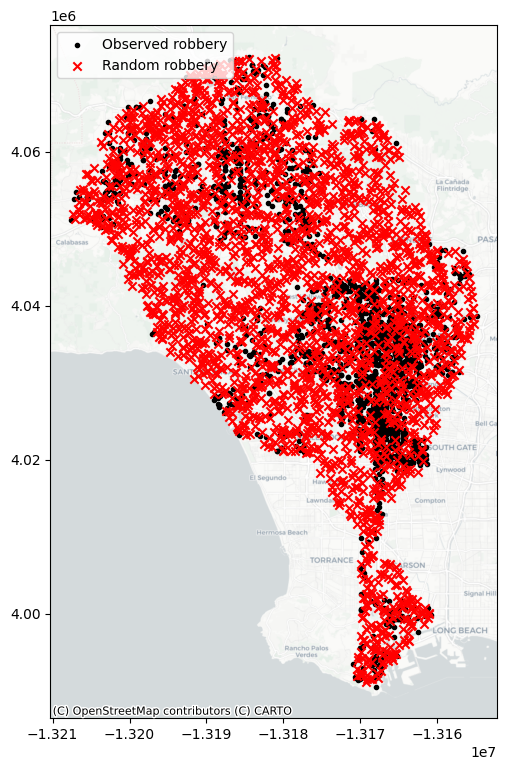

In [34]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(*coordinates.T, color="k", marker=".", label="Observed robbery")
plt.scatter(
    *random_pattern_ashape.T, color="r", marker="x", label="Random robbery"
)
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="upper left")
plt.show()

## Quadrat statistics
Quadrat statistics analyze how points are distributed by counting them in grid cells. They check if points are evenly spread or clustered using a statistical test. In this case, using the default three-by-three grid covering the point pattern.

<Axes: title={'center': 'Quadrat Count'}>

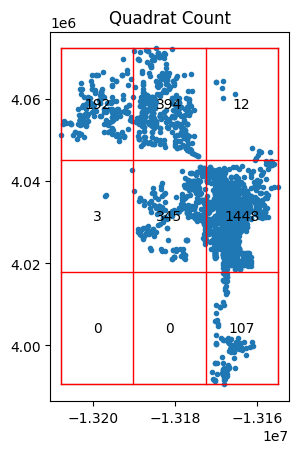

In [35]:
qstat = QStatistic(coordinates)
qstat.plot()

In [36]:
qstat.chi2_pvalue

0.0

In contrast, our completely random point process will distribute points fairly evenly across all cells

<Axes: title={'center': 'Quadrat Count'}>

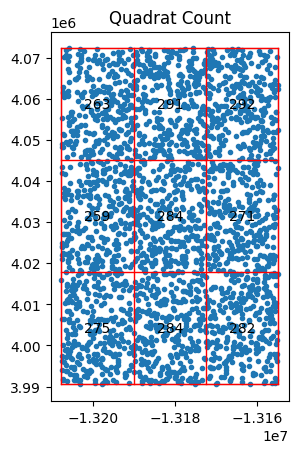

In [37]:

qstat_null = QStatistic(random_pattern)
qstat_null.plot()


In [38]:
qstat_null.chi2_pvalue

0.8618536663354343

Consider our randomly generated set within the alpha shape polygon with the overlaid quadrat grid.

<Axes: title={'center': 'Quadrat Count'}>

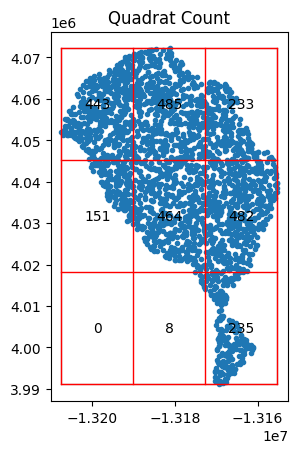

In [39]:

qstat_null_ashape = QStatistic(random_pattern_ashape)
qstat_null_ashape.plot()


The quadrat test identifies this pattern as statistically non-random, even though our simulation ensured it follows a completely spatially random process within the study area.


# Ripley’s Functions in Spatial Analysis
Ripley’s functions analyze point patterns based on two key measures: nearest neighbor distances and gaps. These methods help detect clustering or dispersion by examining distances between points.

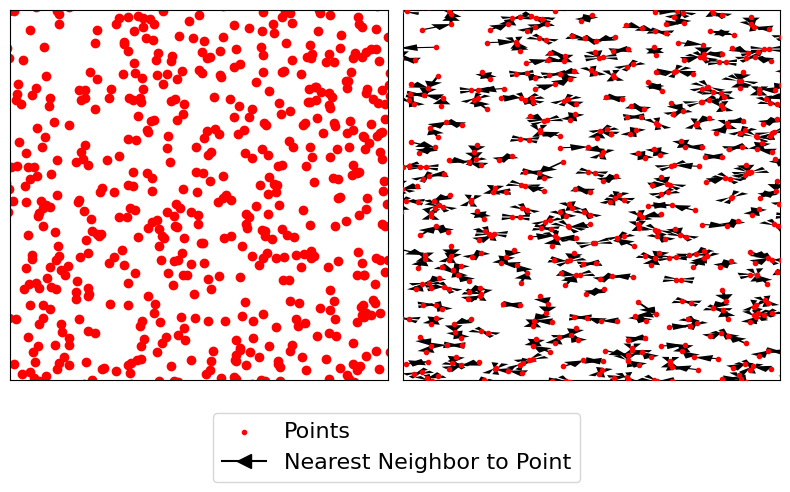

In [41]:
# Code generated for this figure is available on the web version of the book.
f, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
ax[0].scatter(*random_pattern.T, color="red")
ax[1].scatter(
    *random_pattern.T,
    color="red",
    zorder=100,
    marker=".",
    label="Points"
)
nn_ixs, nn_ds = PointPattern(random_pattern).knn(1)
first = True
for coord, nn_ix, nn_d in zip(random_pattern, nn_ixs, nn_ds):
    dx, dy = random_pattern[nn_ix].squeeze() - coord
    arrow = ax[1].arrow(
        *coord,
        dx,
        dy,
        length_includes_head=True,
        overhang=0,
        head_length=300 * 3,
        head_width=300 * 3,
        width=50 * 3,
        linewidth=0,
        facecolor="k",
        head_starts_at_zero=False
    )
    if first:
        plt.plot(
            (1e100, 1e101),
            (0, 1),
            color="k",
            marker="<",
            markersize=10,
            label="Nearest Neighbor to Point",
        )
    first = False

ax[0].axis([-13207339.63777211, -13188257.25703596, 3998020.06171111, 4048508.57847984])
ax[0].set_xticklabels([])
ax[0].set_yticklabels([])
ax[0].set_xticks([])
ax[0].set_yticks([])
f.tight_layout()
ax[1].legend(bbox_to_anchor=(0.5, -0.06), fontsize=16)
plt.show()

## Ripley’s G function
Ripley’s G function focuses on nearest neighbor distances. It calculates the distance from each point to its closest neighbor, summarizing overall  spatial relationships. The flowing plot illustrates this with red dots representing points and black arrows showing nearest neighbor connections.
A clustered pattern has more points close together, while a dispersed pattern has fewer. A completely random pattern falls somewhere in between. If the G function rises quickly with distance, the pattern is likely clustered. If it rises slowly, the pattern is dispersed. If it falls in between, it may be indistinguishable from random variation.

In [42]:

g_test = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=True
)

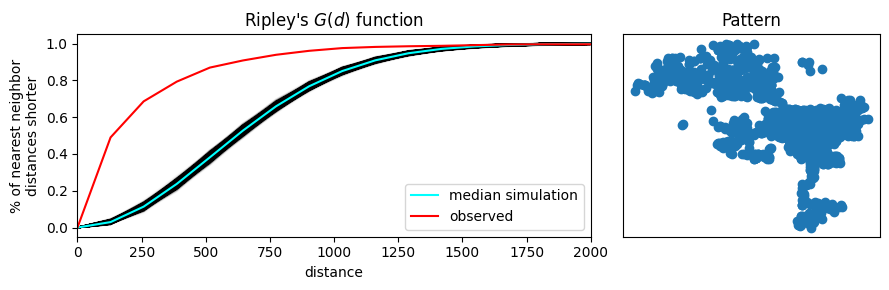

In [43]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)
# plot all the simulations with very fine lines
ax[0].plot(
    g_test.support, g_test.simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax[0].plot(
    g_test.support,
    numpy.median(g_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)


# and the observed pattern's G function
ax[0].plot(
    g_test.support, g_test.statistic, label="observed", color="red"
)

# clean up labels and axes
ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest neighbor\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $G(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

On the left of the graph above, the G function is plotted with distance on the horizontal axis and the fraction of nearest neighbor distances on the vertical axis. The red line shows the actual data, while the blue lines represent simulations of a completely random pattern. The bright blue line is the average of all simulations, and the dark blue/black band shows the range covering 95% of them. The red line rises faster than the simulated random patterns, meaning the observed robbery locations are closer together than expected by chance. This indicates a clustered pattern.

## Ripley’s 𝐹 function
Ripley’s 𝐹 function is known as the "empty space function" because it measures distances from random locations in empty space to the nearest points in the pattern. Unlike the G function, which looks at distances between points, the F function analyzes how points are distributed relative to empty areas. If a pattern has large gaps, the F function increases slowly. If the pattern is highly dispersed, it increases quickly.

In [44]:
f_test = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=True
)

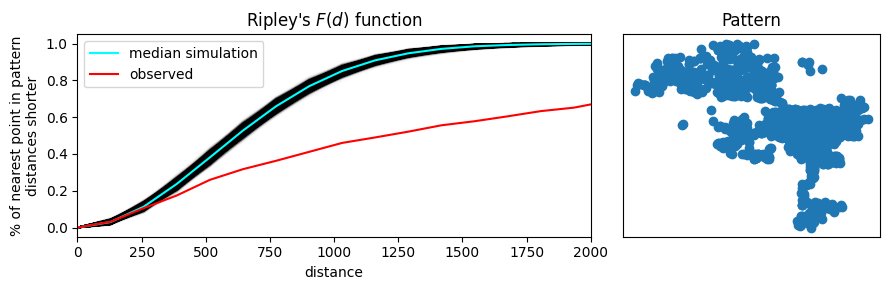

In [45]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)

# plot all the simulations with very fine lines
ax[0].plot(
    f_test.support, f_test.simulations.T, color="k", alpha=0.01
)
# and show the average of simulations
ax[0].plot(
    f_test.support,
    numpy.median(f_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)


# and the observed pattern's F function
ax[0].plot(
    f_test.support, f_test.statistic, label="observed", color="red"
)

# clean up labels and axes
ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest point in pattern\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $F(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

In the graph above, since the observed function rises more slowly than the simulations, we can conclude that the pattern has many gaps and is clustered.

# Identifying clusters
The previous sections focused on whether a point pattern is clustered or dispersed. However, knowing a pattern is clustered doesn’t tell us where the clusters are. To find specific high-density areas, we need a different approach. This section introduces methods to detect and locate clusters, similar to how spatial autocorrelation distinguishes between overall clustering and specific clusters. One widely used method is DBSCAN (Density-Based Spatial Clustering of Applications). Unlike statistical inference methods, DBSCAN is a deterministic algorithm that identifies clusters based on density. It classifies points into three categories:
* Noise – points that don’t belong to any cluster.
* Core points – points within a cluster that have at least m neighbors within a radius r.
* Border points – points in a cluster but with fewer than m neighbors within r.
The user must set m and r, which can greatly affect the results. Next, we’ll see how to apply DBSCAN in Python.

In [116]:
# Define DBSCAN
clusterer = DBSCAN()
# Fit to our data
clusterer.fit(gdb[["x", "y"]])

DBSCAN()

In [117]:
clusterer.eps 

0.5

In [118]:
clusterer.min_samples 

5

In [47]:
# Print the first 5 elements of `cs`
clusterer.core_sample_indices_[:5]

array([0, 3, 4, 5, 7], dtype=int64)

In [48]:
clusterer.labels_[:5]

array([ 0, -1, -1,  1,  2], dtype=int64)

In [49]:
lbls = pandas.Series(clusterer.labels_, index=gdb.index)

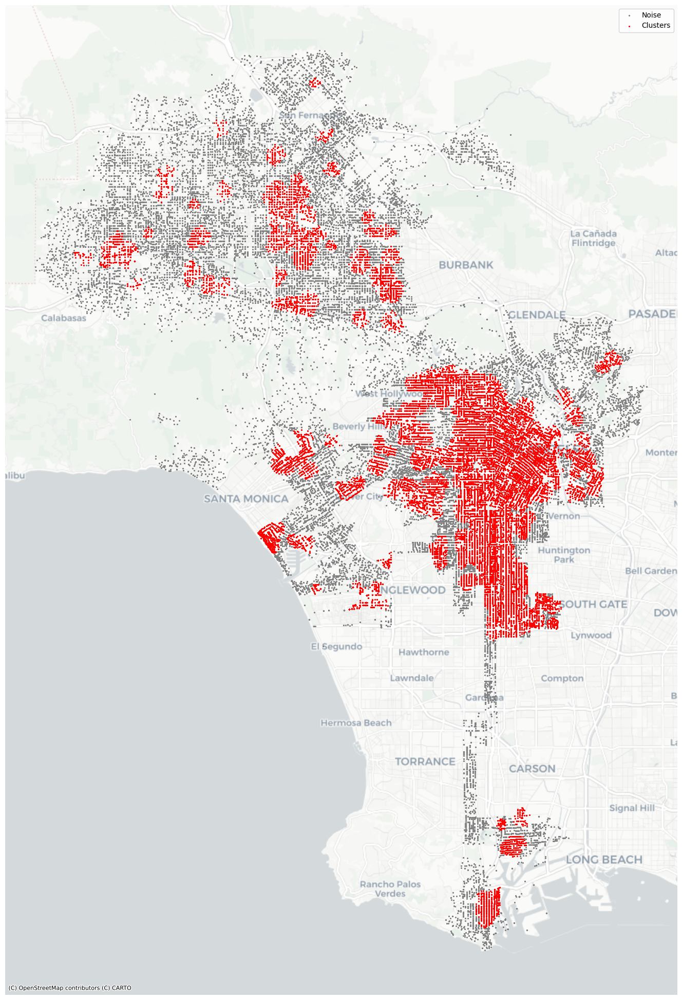

In [89]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(25, 25))

# Subset points that are not part of any cluster (noise)
noise = gdb.loc[lbls == -1, ["x", "y"]]

# Plot noise in grey
scatter_noise = ax.scatter(noise["x"], noise["y"], c="grey", s=5, linewidth=0, label="Noise")

# Plot all points that are not noise in red
scatter_clusters = ax.scatter(
    gdb.loc[gdb.index.difference(noise.index), "x"],
    gdb.loc[gdb.index.difference(noise.index), "y"],
    c="red",
    s=5,
    linewidth=0,
    label="Clusters"
)

# Add basemap
contextily.add_basemap(ax, source=contextily.providers.CartoDB.Positron)

# Remove axes
ax.set_axis_off()

# Add legend
ax.legend(loc="upper right")

# Display the figure
plt.show()


The current DBSCAN results look good with the default settings: a radius of 0.5 meters and a minimum of five points per cluster.

let adjust these parameters:
 * min_samples = 128
 * radius = 300

In [170]:
# Obtain the number of points 1% of the total represents
minp = numpy.round(gdb.shape[0] * 0.001)
minp

128.0

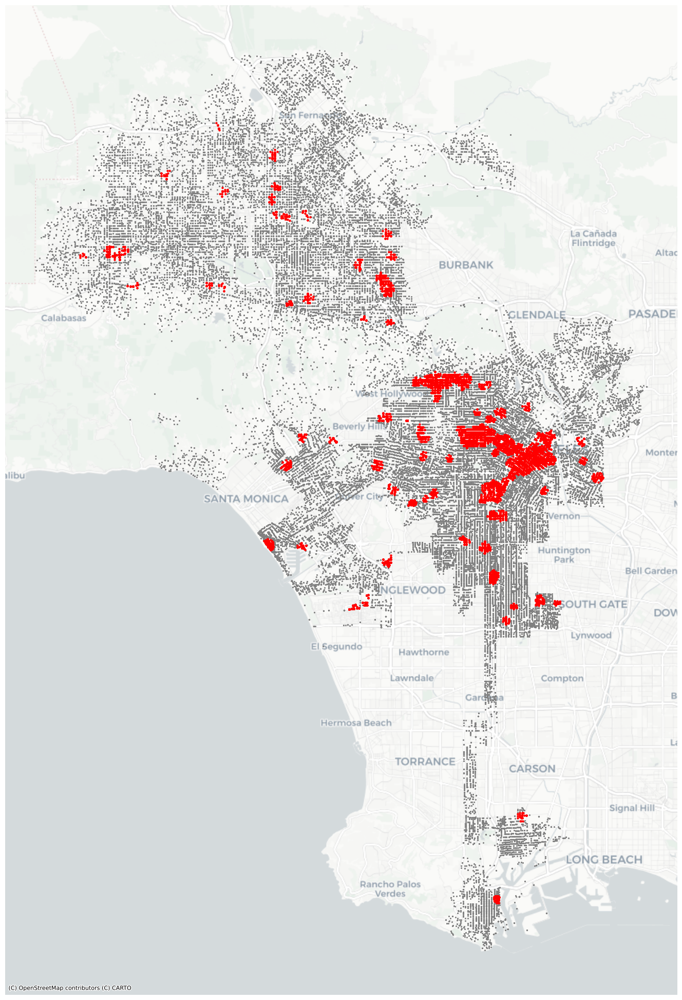

In [172]:
# Rerun DBSCAN
clusterer = DBSCAN(eps=300, min_samples=int(minp))
clusterer.fit(gdb[["x", "y"]])
# Turn labels into a Series
lbls = pandas.Series(clusterer.labels_, index=gdb.index)
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(25, 25))
# Subset points that are not part of any cluster (noise)
noise = gdb.loc[lbls == -1, ["x", "y"]]
# Plot noise in grey
ax.scatter(noise["x"], noise["y"], c="grey", s=5, linewidth=0)
# Plot all points that are not noise in red
# NOTE how this is done through some fancy indexing, where
#      we take the index of all points (db) and substract from
#      it the index of those that are noise
ax.scatter(
    gdb.loc[gdb.index.difference(noise.index), "x"],
    gdb.loc[gdb.index.difference(noise.index), "y"],
    c="red",
    s=10,
    linewidth=0,
)
# Add basemap
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()